In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import skimage.exposure as exposure
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon



def region_of_interest(image, src_pts):
    height = image.shape[0]
    src_pts_ver = np.array([(200, 0), (200, 2250), (1450, 2250), (1450, 1860), (2262,2433),(2864,3345),(3342,3380),(3383,4513),(3800,4513),(3800,0)],dtype=np.int32)
    src_pts_hor = np.array([(2100,3400),(2300,4180),(1754,4200),(1754,4650),(3366,4650),(3360,3400)],dtype=np.int32)
    src_pts_curve = np.array([(200,2617),(200,2240),(800,2240),(800,2150),(1450,2550),(1450,1860),(2262,2433),(2864,3345),(2100,3345),(2225,3738),(2320,4186),(1742,4186),(1226,3215)],dtype=np.int32)
    mask = np.zeros_like(image)
    if src_pts == 'hor':
        cv2.fillPoly(mask, [src_pts_hor], (255,255,255))
    elif src_pts == "ver":
        cv2.fillPoly(mask, [src_pts_ver], (255,255,255))  
    elif src_pts == "curve":
        cv2.fillPoly(mask, [src_pts_curve], (255,255,255))  
    img_masked = cv2.bitwise_and(image,mask)
    
    return img_masked

def canny(image,low_val,high_val,kernel_size,deviation):
    
    # imgGray = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
    # cv2.imshow("Gray Image Warped",imgGray)
    imgBlur = cv2.GaussianBlur(image,(kernel_size,kernel_size),deviation)  ##(image, kernel size, deviation)
    # cv2.imshow("Blur Image Warped",imgBlur)
    imgCanny= cv2.Canny(imgBlur,low_val,high_val) ##Applies gaussian Blur byitself
    return imgCanny

def hough_tf(og_image,image,min_pixel_size,threshold,min_line,max_gap,angle_in,slope):
    # Use Hough Line Transform to find lines
    lines = cv2.HoughLinesP(image,min_pixel_size, np.pi/180, threshold=threshold, minLineLength = min_line ,maxLineGap = max_gap)
    
    if lines is not None:
        for i in range(0, len(lines)):
            l = lines[i][0]
            angle = np.arctan2(l[3] - l[1], l[2] - l[0])
            angle_deg = np.degrees(angle)
            if slope == "hor":
                if abs(angle_deg) < angle_in or abs(angle_deg - 180) < angle_in:
                    cv2.line(og_image, (l[0], l[1]), (l[2], l[3]), (0,0,255), 3, cv2.LINE_AA)
            elif slope == "ver":
                if abs(angle_deg) == 90 :
                    cv2.line(og_image, (l[0], l[1]), (l[2], l[3]), (255,0,0), 2, cv2.LINE_AA)
            elif slope == "curve":
                cv2.line(og_image, (l[0], l[1]), (l[2], l[3]), (255,255,0), 3, cv2.LINE_AA)
    return og_image




def sobel(image,kernel_size,slope):
    
    # Apply Sobel filter to detect vertical edges
  
    # image = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
    sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=kernel_size)
    sobel_y = np.abs(sobel_y)
    
    # Apply Sobel filter to detect vertical edges
    sobel_x = cv2.Sobel(image, cv2.CV_64F, 1,0, ksize=kernel_size)
    sobel_x = np.abs(sobel_x)
    
    sobel_combined = 0.5*sobel_x + 0.5*sobel_y
    sobel_combined = exposure.rescale_intensity(sobel_combined, in_range='image', out_range=(0,255)).astype(np.uint8)
    sobel_x = exposure.rescale_intensity(sobel_x, in_range='image', out_range=(0,255)).astype(np.uint8)
    sobel_y = exposure.rescale_intensity(sobel_y, in_range='image', out_range=(0,255)).astype(np.uint8)
    if slope =='ver':
        return sobel_x
    elif slope == 'hor':
        return sobel_y
    elif slope == "curve":
        return sobel_combined

def mask_image(image, lower_bound, upper_bound):

    # Convert the image to the HSV color space
    hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    
    # Create a mask based on the specified RGB ranges
    mask = cv2.inRange(hsv_image, lower_bound, upper_bound)

    # Apply the mask to the original image
    # mask = cv2.bitwise_or(mask_1,mask_2)
    masked_image = cv2.bitwise_and(image, image, mask=mask)

    return masked_image

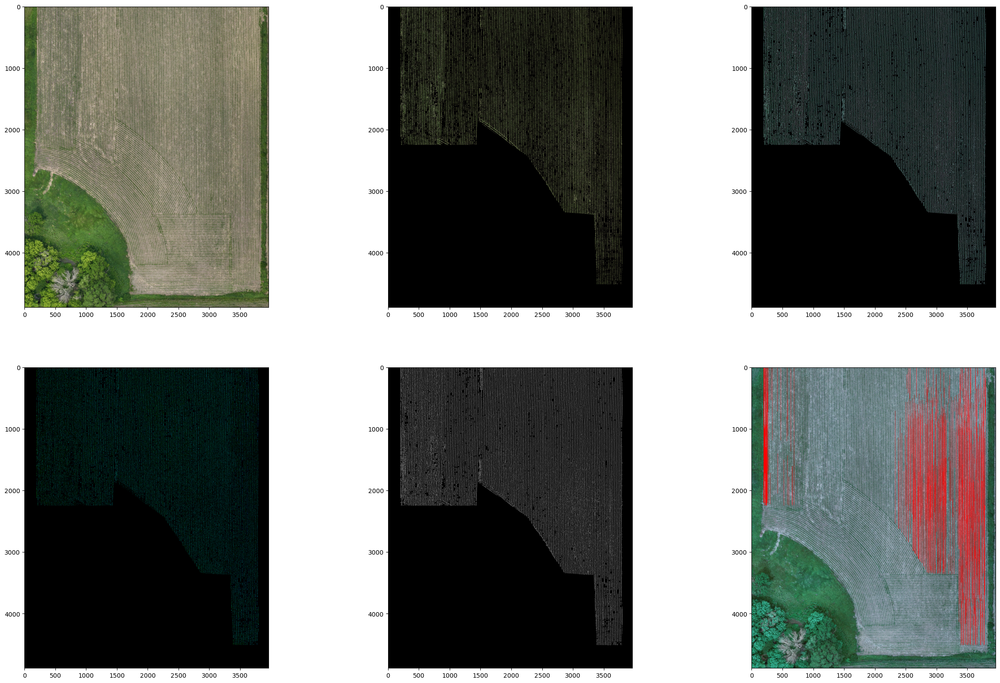

In [2]:
img = cv2.imread('/home/aparame/Salin247/field.jpg')
fig = plt.figure(figsize = (30,30))
plt.subplot(3,3,1)

plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

#Make a copy of the image
field_image_og= np.copy(img)
field_image_ver = cv2.cvtColor(field_image_og, cv2.COLOR_BGR2RGB)


#Crop Image for this round
src_pts = 'ver'
field_image_ver = region_of_interest(field_image_ver,src_pts)

# Define the lower and upper bounds for the RGB range you want to mask
lower_rgb = np.array([20, 40, 0])  # Replace with your lower RGB values
upper_rgb = np.array([180, 175, 120])  # Replace with your upper RGB values

#For masking green colors
masked_image_ver = mask_image(field_image_ver,lower_rgb,upper_rgb)
plt.subplot(3,3,2)
plt.imshow(masked_image_ver)


#sobel edge detections
sobel_image_ver = sobel(masked_image_ver,5,src_pts)
plt.subplot(3,3,3)
plt.imshow(cv2.cvtColor(sobel_image_ver, cv2.COLOR_BGR2RGB))

#threshold image
threshold_image_ver = cv2.threshold(sobel_image_ver,200,255,cv2.THRESH_BINARY)[1]
plt.subplot(3,3,4)
plt.imshow(cv2.cvtColor(threshold_image_ver, cv2.COLOR_BGR2RGB))


#for edge detection
canny_image_ver = canny(sobel_image_ver,280,300,3,0)     ##Canny edge detection with pre-built GaussianBlur (img,low,high,odd_number_kernel,dev)
# fig = plt.figure(figsize = (20,20))
plt.subplot(3,3,5)
plt.imshow(cv2.cvtColor(canny_image_ver, cv2.COLOR_BGR2RGB))

# Use Hough Line Transform to find lines

image_w_lines_ver = hough_tf(field_image_og,canny_image_ver,2.5,200,10,100,0.1,src_pts)   #pixel_size,threshold,minLineLength,maxGap,angleofLine
plt.subplot(3,3,6)
plt.imshow(image_w_lines_ver)



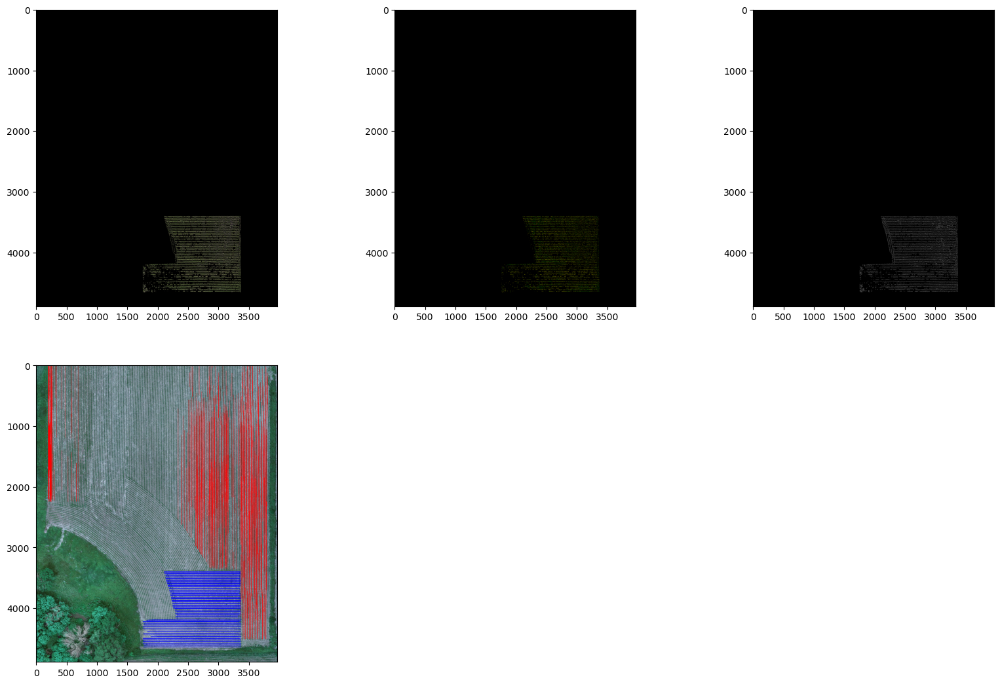

In [3]:
fig = plt.figure(figsize = (20,20))
#Crop Image for this round
src_pts_2 = 'hor'
field_image_hor = region_of_interest(field_image_og,src_pts_2)

# Define the lower and upper bounds for the RGB range you want to mask
lower_rgb = np.array([20, 40, 0])  # Replace with your lower RGB values
upper_rgb = np.array([180, 175, 120])  # Replace with your upper RGB values

#For masking green colors
masked_image_hor = mask_image(field_image_hor,lower_rgb,upper_rgb)



#sobel edge detections
sobel_image_hor = sobel(masked_image_hor,5,src_pts_2)
plt.subplot(3,3,1)
plt.imshow(cv2.cvtColor(sobel_image_hor, cv2.COLOR_BGR2RGB))

#threshold image
threshold_image_hor = cv2.threshold(sobel_image_hor,200,255,cv2.THRESH_BINARY)[1]
plt.subplot(3,3,2)
plt.imshow(cv2.cvtColor(threshold_image_hor, cv2.COLOR_BGR2RGB))


#for edge detection
canny_image_hor = canny(masked_image_hor,280,300,3,0)     ##Canny edge detection with pre-built GaussianBlur (img,low,high,odd_number_kernel,dev)
# fig = plt.figure(figsize = (20,20))
plt.subplot(3,3,3)
plt.imshow(cv2.cvtColor(canny_image_hor, cv2.COLOR_BGR2RGB))

# Use Hough Line Transform to find lines

image_w_lines_hor = hough_tf(field_image_og,canny_image_hor,6,600,1000,600,0.1,src_pts_2)   #pixel_size,threshold,minLineLength,maxGap,angleofLine
plt.subplot(3,3,4)
plt.imshow(image_w_lines_hor)

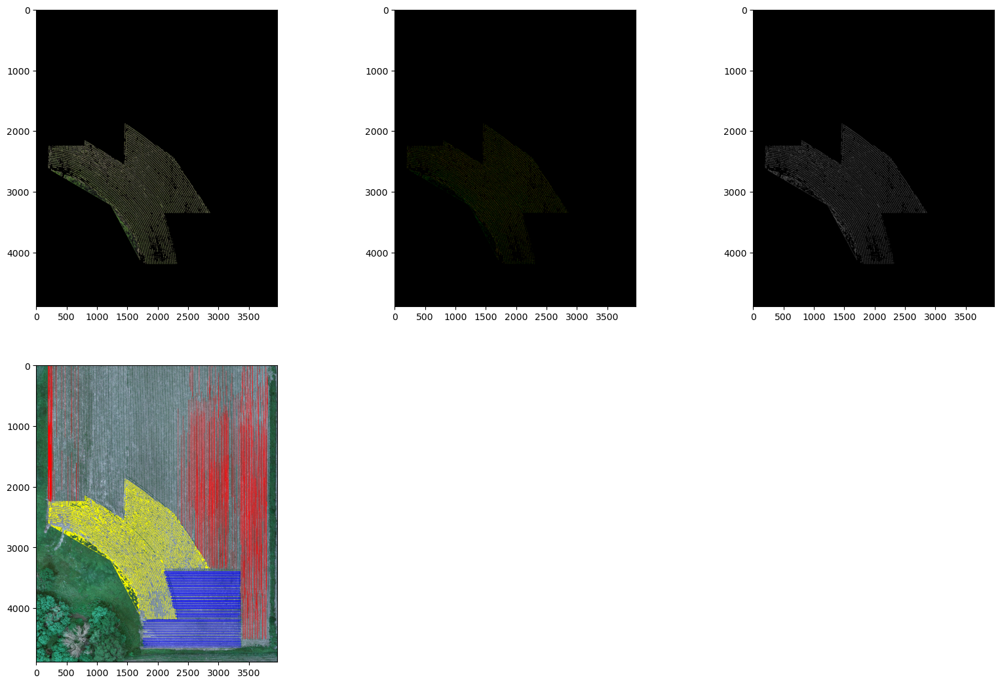

In [4]:
fig = plt.figure(figsize = (20,20))
field_image_cur = np.copy(field_image_og)
#Crop Image for this round
src_pts_3 = 'curve'
field_image_cur= region_of_interest(field_image_og,src_pts_3)

# Define the lower and upper bounds for the RGB range you want to mask
lower_rgb = np.array([20, 40, 0])  # Replace with your lower RGB values
upper_rgb = np.array([180, 175, 120])  # Replace with your upper RGB values

#For masking green colors
masked_image_cur = mask_image(field_image_cur,lower_rgb,upper_rgb)



#sobel edge detections
sobel_image_cur = sobel(masked_image_cur,5,src_pts_3)
plt.subplot(3,3,1)
plt.imshow(cv2.cvtColor(sobel_image_cur, cv2.COLOR_BGR2RGB))

#threshold image
threshold_image_cur = cv2.threshold(sobel_image_cur,200,255,cv2.THRESH_BINARY)[1]
plt.subplot(3,3,2)
plt.imshow(cv2.cvtColor(threshold_image_cur, cv2.COLOR_BGR2RGB))


#for edge detection
canny_image_cur = canny(masked_image_cur,280,300,3,0)     ##Canny edge detection with pre-built GaussianBlur (img,low,high,odd_number_kernel,dev)
# fig = plt.figure(figsize = (20,20))
plt.subplot(3,3,3)
plt.imshow(cv2.cvtColor(canny_image_cur, cv2.COLOR_BGR2RGB))

# Use Hough Line Transform to find lines

image_w_lines_cur = hough_tf(field_image_og,canny_image_cur,2,10,10,10,0.1,src_pts_3)   #pixel_size,threshold,minLineLength,maxGap,angleofLine
plt.subplot(3,3,4)
plt.imshow(image_w_lines_cur)

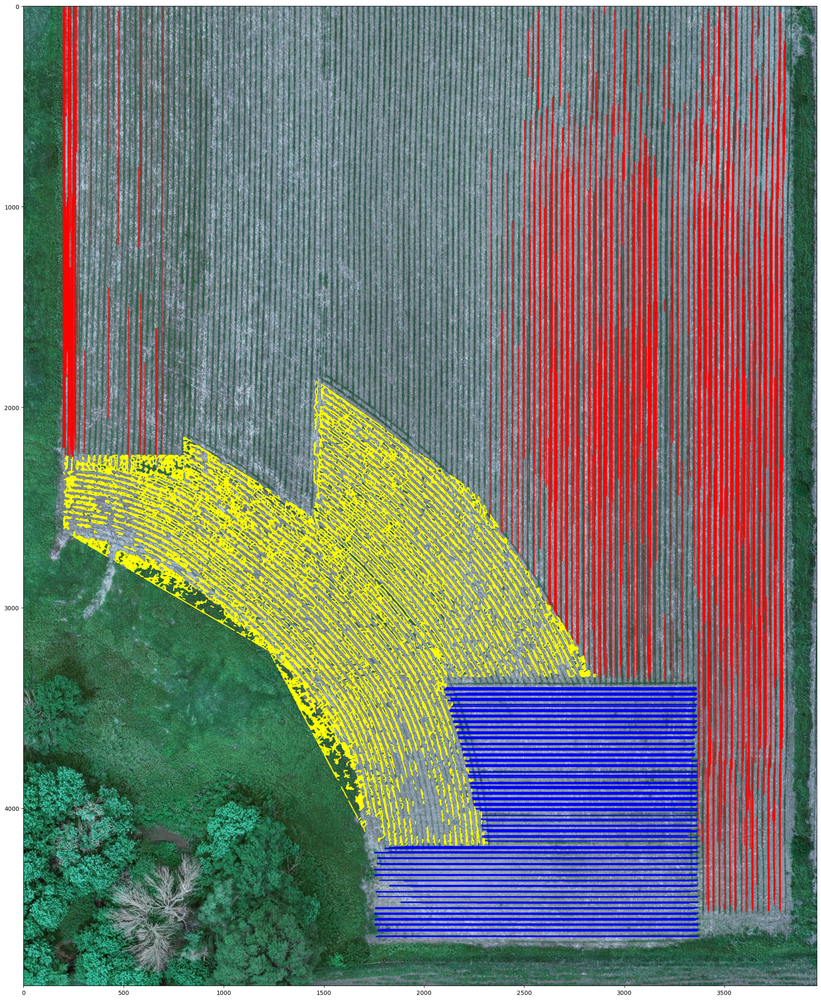

In [5]:
fig = plt.figure(figsize = (30,30))
plt.imshow(image_w_lines_cur)
